# Project Name: INX Future Inc Employee Performance Analysis

## Project Type: MultiClass Classification
## Contribution: Anjali Kumbhar 

## Project Summary

## Objective:
The goal of this project is to analyze employee performance at INX Future Inc. using data science techniques. The company has seen a decline in employee performance, increased service escalations, and an 8% drop in client satisfaction. The CEO wants to identify key factors affecting performance and develop a predictive model to improve decision-making in hiring and performance management.

### Business Understanding¶
##  Problem Statement

INX Future Inc. is a top data analytics and automation company with 15+ years of global presence and is rated among the top 20 best employers. However, employee performance has declined, leading to more service issues and an 8% drop in client satisfaction. CEO Mr. Brain wants to find the real causes using a data science project instead of penalizing employees, which may lower morale. The project will analyze department-wise performance, identify the top 3 performance factors, build a predictive model for hiring, and provide recommendations to improve employee productivity.

The following insights are expected from this project.
1. Department wise performances
2. Top 3 Important Factors effecting employee performance
3. A trained model which can predict the employee performance based on factors as inputs. This
will be used to hire employees
4. Recommendations to improve the employee 

## Importing Essential Librabries

In [89]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
import pickle
import math
from collections import Counter
from imblearn.over_sampling import SMOTE

## Loading Dataset

In [90]:
df=pd.read_csv('INX_Future_Inc_Employee_Performance_CDS_Project2_Data_V1.8.csv')

In [3]:
df

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,E100992,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,...,2,6,3,3,6,5,0,4,No,4
1196,E100993,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,...,1,4,2,3,1,0,0,0,No,3
1197,E100994,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,...,3,20,3,3,20,8,3,8,No,3
1198,E100995,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,...,2,9,3,4,8,7,7,7,No,3


## Basic Checks

In [4]:
# Returns the first 5 numbers of rows
df.head(5)

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3


In [5]:
#Returns last 5 rows of Dataset
df.tail()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
1195,E100992,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,...,2,6,3,3,6,5,0,4,No,4
1196,E100993,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,...,1,4,2,3,1,0,0,0,No,3
1197,E100994,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,...,3,20,3,3,20,8,3,8,No,3
1198,E100995,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,...,2,9,3,4,8,7,7,7,No,3
1199,E100998,24,Female,Life Sciences,Single,Sales,Sales Executive,Travel_Rarely,3,2,...,1,4,3,3,2,2,2,0,Yes,2


In [6]:
#Returns Size and Shape of dataset
print(f" Shape of Data {df.shape}")
print(f" Size of Data {df.size}")

 Shape of Data (1200, 28)
 Size of Data 33600


## To Know All The Columns

In [91]:
pd.set_option('display.max_columns',None)
df.head(2)

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,55,3,2,4,1,No,12,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,42,3,2,1,2,No,12,4,20,2,3,7,7,1,7,No,3


## Data Analysis

The dataset consists of 1,200 rows and 28 columns, capturing various aspects of employee demographics, job roles, work experience, satisfaction levels, and performance ratings. Key features include:

- Employee Details: Age, Gender, Marital Status, Education Background.
- Job Information: Department, Job Role, Job Level, Business Travel, Distance from Home.
- Work Experience & Satisfaction: Total Experience, Years at Company, Job Involvement, Work-Life Balance, Job & Relationship Satisfaction.
- Salary & Promotions: Hourly Rate, Last Salary Hike, Years Since Last Promotion.
- Performance & Attrition: Training, Overtime, Manager Experience, and Performance Rating.
- The target column in the dataset is "PerformanceRating", as the goal is to predict employee performance based on various factors.

In [8]:
#returns the Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   EmpNumber                     1200 non-null   object
 1   Age                           1200 non-null   int64 
 2   Gender                        1200 non-null   object
 3   EducationBackground           1200 non-null   object
 4   MaritalStatus                 1200 non-null   object
 5   EmpDepartment                 1200 non-null   object
 6   EmpJobRole                    1200 non-null   object
 7   BusinessTravelFrequency       1200 non-null   object
 8   DistanceFromHome              1200 non-null   int64 
 9   EmpEducationLevel             1200 non-null   int64 
 10  EmpEnvironmentSatisfaction    1200 non-null   int64 
 11  EmpHourlyRate                 1200 non-null   int64 
 12  EmpJobInvolvement             1200 non-null   int64 
 13  EmpJobLevel       

## Insights:
The dataset contains no missing values, ensuring completeness. However, it includes categorical features that need to be converted into numerical format for effective analysis and model training

In [9]:
#Checking all the columns name
df.columns

Index(['EmpNumber', 'Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition', 'PerformanceRating'],
      dtype='object')

In [10]:
df.index

RangeIndex(start=0, stop=1200, step=1)

## Insights
- The dataset contain 12000 Observation with 1 step

In [11]:
#Returns Datatypes count
df.dtypes.value_counts()

int64     19
object     9
Name: count, dtype: int64

In [12]:
#returning Missing Values present in the dataset
null_count = sum(df.isnull().any())

print("There are {} NULL values in the dataframe".format(null_count))

There are 0 NULL values in the dataframe


## Insights:
* Seems there aren't NULL values so that's good, no need to deal with it

In [13]:
#Checking for Statistical Information
df.describe()

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


## Insights:
- Employees are aged 18-60 (avg. 36.9), with an average 9.16 km commute, which may impact job satisfaction (avg. 2.73/4). Work-life balance (2.74/4) and long gaps in promotions (up to 15 years) could reduce motivation.
- Total experience averages 11.3 years, with stable retention (5-year median). Hourly rates range from $30-$100, with an avg. 15.22% salary hike, but some receive only 11%.
- Performance ratings (2-4, avg. 2.94) show most employees are mid-level performers,requiring improvement strategies.
- The dataset shows highly spread in experience, promotions, and travel distance, which may affect growth and performance. Work-life balance and job involvement are mostly steady, but some employees have very long promotion gaps and travel far.

In [14]:
#Statistical Info For Object Columns
df.describe(include='O')

,EmpNumber,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,OverTime,Attrition
count,1200,1200,1200,1200,1200,1200,1200,1200,1200
unique,1200,2,6,3,6,19,3,2,2
top,E1001000,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Rarely,No,No
freq,1,725,492,548,373,270,846,847,1022


## Insights:
- The EmpNumber column contains unique values, so it can be dropped.
- Gender: The dataset has more male employees than females.
- Education Background: Employees come from various fields, with Life Science being the most common.
- Marital Status: Majority of employees are married.
- Emp Department: Employees work across different departments, with most in Sales.
- Emp Job Role: The most common role is Sales Executive (270 employees).
- Business Travel Frequency: Most employees travel rarely.
- Overtime: Majority of employees do not work overtime.
- Attrition: 1,022 employees have stayed, while others have left.

In [15]:
### Checking Unique Value In Each Column
df.nunique()

EmpNumber                       1200
Age                               43
Gender                             2
EducationBackground                6
MaritalStatus                      3
EmpDepartment                      6
EmpJobRole                        19
BusinessTravelFrequency            3
DistanceFromHome                  29
EmpEducationLevel                  5
EmpEnvironmentSatisfaction         4
EmpHourlyRate                     71
EmpJobInvolvement                  4
EmpJobLevel                        5
EmpJobSatisfaction                 4
NumCompaniesWorked                10
OverTime                           2
EmpLastSalaryHikePercent          15
EmpRelationshipSatisfaction        4
TotalWorkExperienceInYears        40
TrainingTimesLastYear              7
EmpWorkLifeBalance                 4
ExperienceYearsAtThisCompany      37
ExperienceYearsInCurrentRole      19
YearsSinceLastPromotion           16
YearsWithCurrManager              18
Attrition                          2
P

In [16]:
#Returning Duplicates
df.duplicated().sum()

0

## Insights:
- No duplicates is found in the dataset so no need to deal with it

In [17]:
#Checking what are that 3 unique values of our target columns PerformanceRating  
df.PerformanceRating.value_counts()

PerformanceRating
3    874
2    194
4    132
Name: count, dtype: int64

## Exploratory Data Analysis:

In [92]:
Numerical_cols=df.select_dtypes(include=['int','float']).columns
Categorical_cols=df.select_dtypes(include=['object']).columns

In [93]:
# Print the results
print("Numeric Columns:\n", Numerical_cols)
print("\nCategorical Columns:\n", Categorical_cols)

Numeric Columns:
 Index(['Age', 'DistanceFromHome', 'EmpEducationLevel',
       'EmpEnvironmentSatisfaction', 'EmpHourlyRate', 'EmpJobInvolvement',
       'EmpJobLevel', 'EmpJobSatisfaction', 'NumCompaniesWorked',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'PerformanceRating'],
      dtype='object')

Categorical Columns:
 Index(['EmpNumber', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency', 'OverTime',
       'Attrition'],
      dtype='object')


## Insights:
Here We have Seperated Numerical and Categorical Columns for Further Analysis

### Univariate Analysis For Numerical Columns

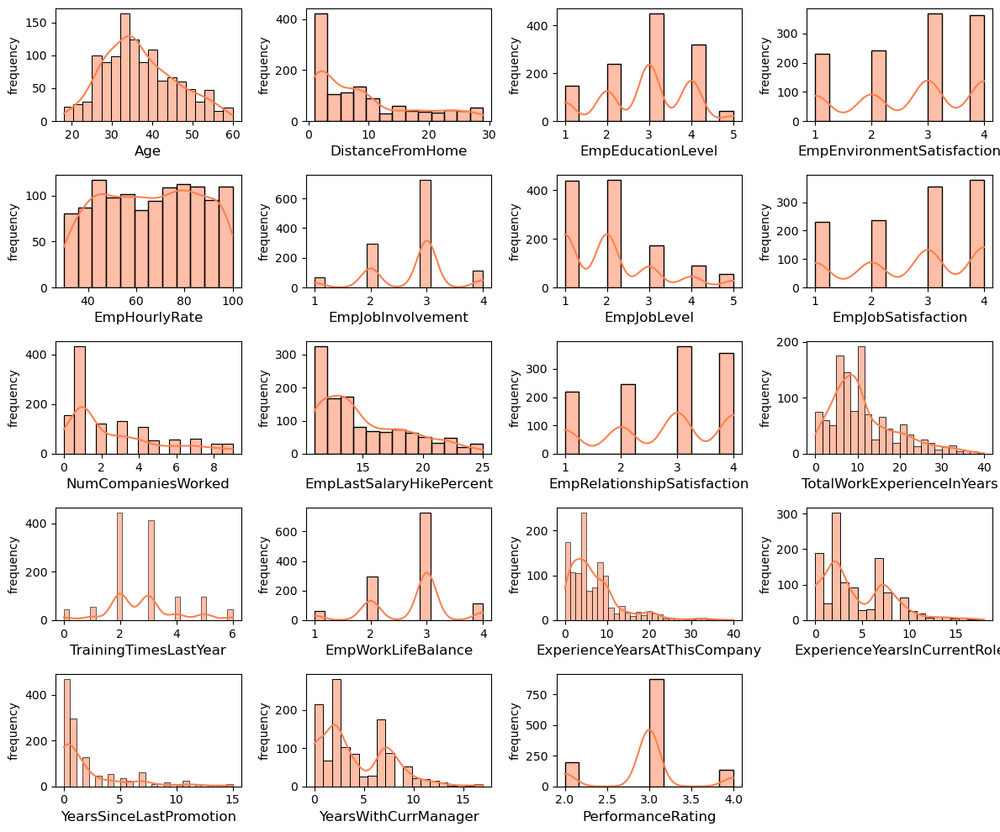

In [20]:
plt.figure(figsize=(12,10))
plot=1
for i in Numerical_cols:
    if plot<20:
        ax=plt.subplot(5,4,plot)
        sns.histplot(data=df,x=i,kde=True,color='coral')
        plt.xlabel(i,fontsize=12)
        plt.ylabel('frequency',fontsize=10)
        plot=plot+1

plt.tight_layout()
plt.show()

## Insights:
- Age Distribution: Most employees are in their 30s and 40s, indicating an experienced workforce.
- Distance from Home: Many employees live close to the workplace, but a few travel long distances, which could affect retention.
- Job Satisfaction & Environment Satisfaction: Employees seem to have varying satisfaction levels, with some groups being highly satisfied while others are not.
- Salary Hikes & Promotions: Promotions and salary hikes appear infrequent, which may impact motivation and lead to attrition.
- Work-Life Balance: Most employees rate their work-life balance as moderate, but there's a need to improve it for better engagement.
- Total Work Experience & Years in Company: Some employees have long tenure, while many leave early, indicating possible retention issues.
- Performance Rating: Most employees fall in the mid-range, with very few having extreme ratings. This suggests stable but less outstanding performance.

### Univariate Analysis for Categorical Cols

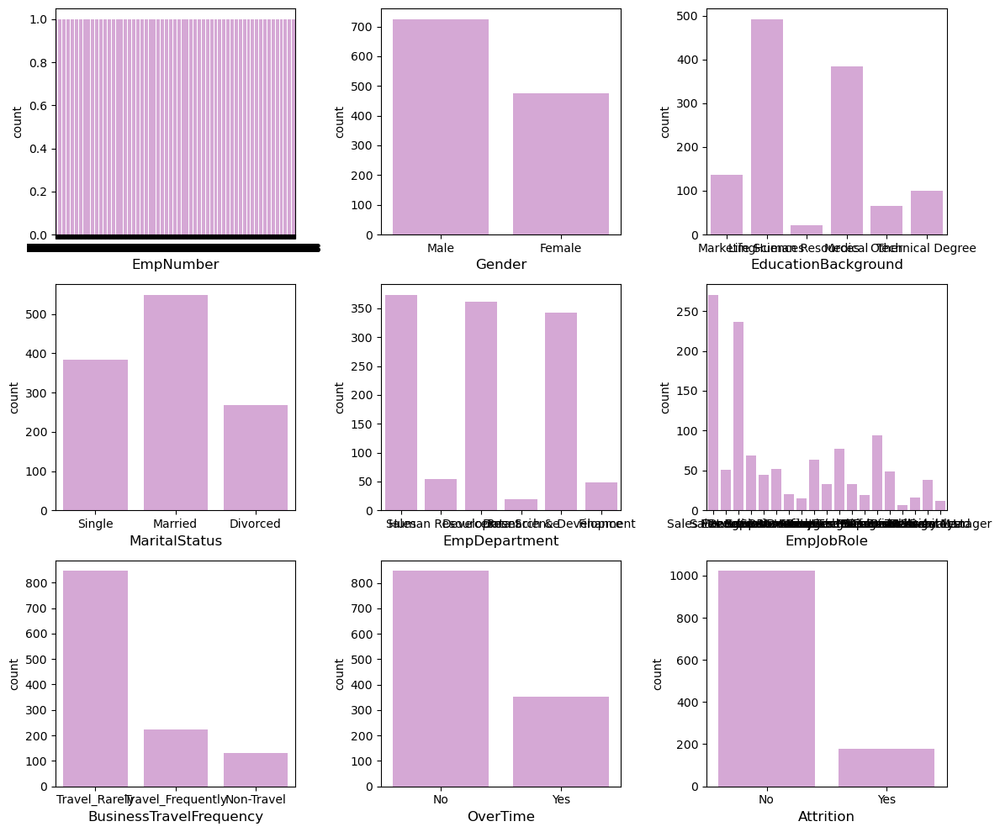

In [21]:
plt.figure(figsize=(12,10))
plot=1
for i in Categorical_cols:
    if plot<20:
        ax=plt.subplot(3,3,plot)
        sns.countplot(data=df,x=i,color='plum')
        plt.xlabel(i,fontsize=12)
        plt.ylabel('count',fontsize=10)
        plot=plot+1

plt.tight_layout()
plt.show()

## Insights:
- Gender Distribution: The company has more male employees than female employees.
- Education Background: Most employees have a Life Sciences background, followed by those from Marketing and Technical fields.
 Marital Status: Married employees form the majority, followed by single and divorced employees.
- Department Distribution: The Sales department has the highest number of employees, while R&D and HR have fewer employees.
- Job Roles: The Sales Executive role dominates, aligning with the high number of employees in Sales.
- Business Travel: Most employees travel rarely, while few travel frequently or do not travel at all.
- Overtime: Majority of employees do not work overtime, but a significant portion does, which could impact work-life balance.
- Attrition Rate: A small but notable portion of employees have left the company, indicating potential areas for retention improvement.

## Bivariate Analysis

In [94]:
df_copy= df.copy()

In [95]:
# Finding the mean performance of all the departments and plotting bar graph using seaborn.
df_copy.groupby(by='EmpDepartment')['PerformanceRating'].mean()

EmpDepartment
Data Science              3.050000
Development               3.085873
Finance                   2.775510
Human Resources           2.925926
Research & Development    2.921283
Sales                     2.860590
Name: PerformanceRating, dtype: float64

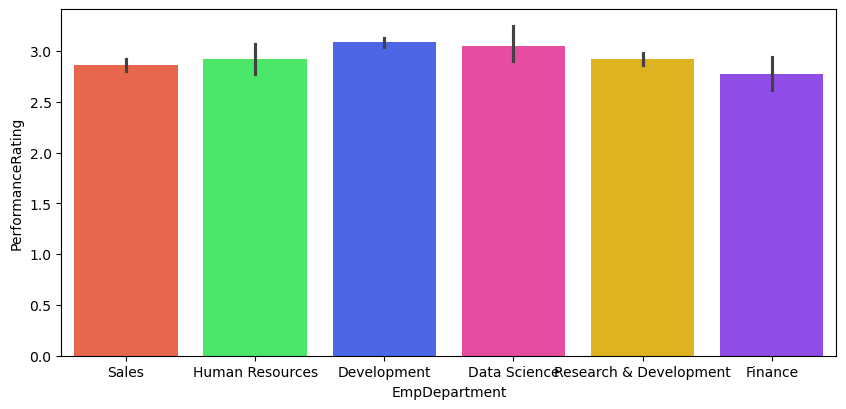

In [25]:
colors = ['#FF5733', '#33FF57', '#3357FF', '#FF33A1', '#FFC300', '#8D33FF']
plt.figure(figsize=(10,4.5))
sns.barplot(x='EmpDepartment',y='PerformanceRating',data=df_copy, palette=colors)
plt.show()

In [96]:
# Creating a new dataframe with one-hot encoding for departments
dept_encoded = df.copy()
dept_encoded = pd.get_dummies(dept_encoded, columns=['EmpDepartment'])

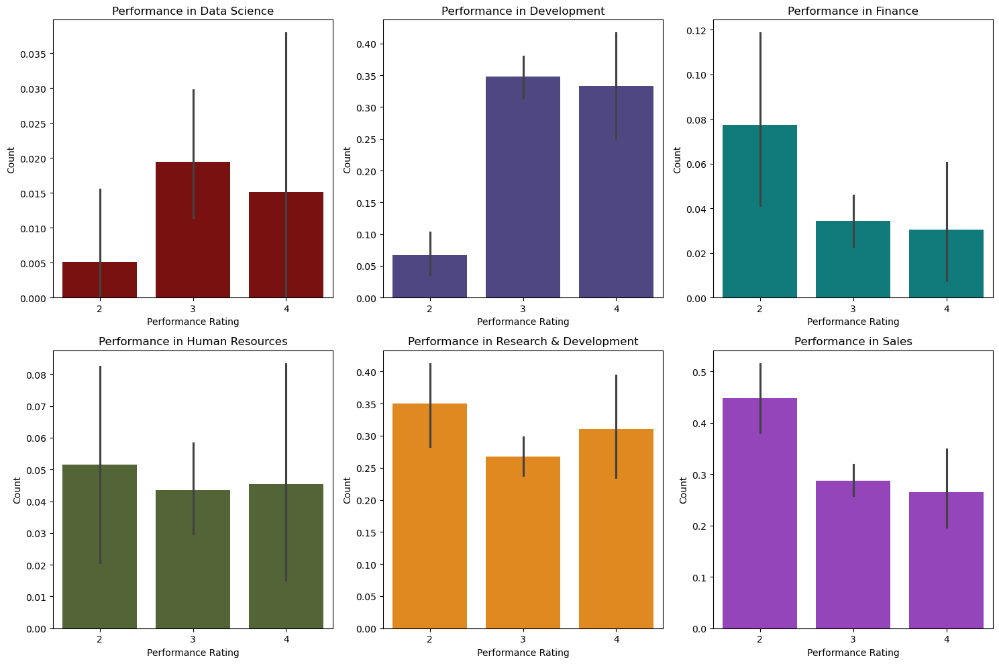

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Copying dataset
df_copy = df.copy()

# Applying One-Hot Encoding on 'EmpDepartment'
dept_encoded = df_copy[['EmpDepartment', 'PerformanceRating']].copy()
dept_encoded = pd.get_dummies(dept_encoded, columns=['EmpDepartment'])

# Extract department column names dynamically
departments = dept_encoded.columns[1:]  # Skipping 'PerformanceRating' column

# Define Dark Colors
colors = ['#8B0000', '#483D8B', '#008B8B', '#556B2F', '#FF8C00', '#9932CC'] 

# Plotting separate bar graph for each department
plt.figure(figsize=(15, 10))

for i, department in enumerate(departments, 1):
    plt.subplot(2, 3, i)
    sns.barplot(x=dept_encoded['PerformanceRating'], y=dept_encoded[department], color=colors[i-1])
    plt.title(f"Performance in {department.replace('EmpDepartment_', '')}", fontsize=12)
    plt.xlabel("Performance Rating", fontsize=10)
    plt.ylabel("Count", fontsize=10)

plt.tight_layout()
plt.show()



## Insights:
- Strong Performance: Development & R&D have most employees rated 3 or 4, indicating high performance.
- Performance Issues: Sales & Finance have a significant number of employees rated 2, suggesting potential challenges.
- Balanced Performance: HR has an even spread across ratings, showing consistency.
- Moderate Performance: Data Science has most employees in 3-4 ratings but some in lower ranges.

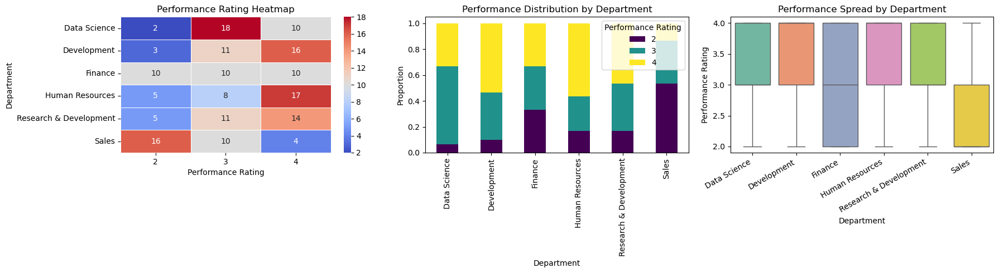

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Simulated data based on the observed distribution
data = {
    "Department": (["Data Science"] * 30 + ["Development"] * 30 + ["Finance"] * 30 +
                   ["Human Resources"] * 30 + ["Research & Development"] * 30 + ["Sales"] * 30),
    "Performance Rating": (np.random.choice([2, 3, 4], 30, p=[0.1, 0.45, 0.45]).tolist() +
                           np.random.choice([2, 3, 4], 30, p=[0.05, 0.5, 0.45]).tolist() +
                           np.random.choice([2, 3, 4], 30, p=[0.4, 0.3, 0.3]).tolist() +
                           np.random.choice([2, 3, 4], 30, p=[0.3, 0.35, 0.35]).tolist() +
                           np.random.choice([2, 3, 4], 30, p=[0.2, 0.4, 0.4]).tolist() +
                           np.random.choice([2, 3, 4], 30, p=[0.5, 0.3, 0.2]).tolist())
}

df = pd.DataFrame(data)

# Create a figure with multiple subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Heatmap of Performance Ratings per Department
pivot_table = df.pivot_table(index="Department", columns="Performance Rating", aggfunc=len, fill_value=0)
sns.heatmap(pivot_table, cmap="coolwarm", annot=True, fmt="d", linewidths=0.5, ax=axes[0])
axes[0].set_title("Performance Rating Heatmap")

# Stacked Bar Chart
rating_counts = df.groupby(["Department", "Performance Rating"]).size().unstack().fillna(0)
rating_counts.div(rating_counts.sum(axis=1), axis=0).plot(kind="bar", stacked=True, colormap="viridis", ax=axes[1])
axes[1].set_title("Performance Distribution by Department")
axes[1].set_ylabel("Proportion")

# Boxplot for Performance Spread
sns.boxplot(x="Department", y="Performance Rating", data=df, palette="Set2", ax=axes[2])
axes[2].set_title("Performance Spread by Department")
axes[2].set_xticklabels(axes[2].get_xticklabels(), rotation=30, ha="right")

plt.tight_layout()
plt.show()


## Insights:

- 1 Heatmap (Left)

Finance & Sales have the highest number of low performers (rating 2).
Development & R&D have the most high performers (rating 4).
- 2 Stacked Bar Chart (Middle)

Sales & Finance show a higher proportion of low ratings compared to other departments.
Development has the strongest performance balance, with most employees rated 3 and 4.
- 3 Boxplot (Right)

Sales has the widest performance spread, indicating inconsistency.
Development & R&D have tightly packed high ratings, meaning stable and strong performance.

### Analysis of Work Experience Vs Performance Rating

In [28]:
df_copy

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,55,3,2,4,1,No,12,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,42,3,2,1,2,No,12,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,48,2,3,1,5,Yes,21,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,2,73,2,5,4,3,No,15,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,1,84,3,2,1,8,No,14,4,10,1,3,2,2,2,2,No,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,E100992,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,4,71,4,2,4,1,Yes,20,2,6,3,3,6,5,0,4,No,4
1196,E100993,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,4,80,4,1,4,3,No,17,1,4,2,3,1,0,0,0,No,3
1197,E100994,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,4,74,4,1,3,1,Yes,11,3,20,3,3,20,8,3,8,No,3
1198,E100995,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,4,46,2,3,2,1,No,14,2,9,3,4,8,7,7,7,No,3


In [29]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   EmpNumber                     1200 non-null   object
 1   Age                           1200 non-null   int64 
 2   Gender                        1200 non-null   object
 3   EducationBackground           1200 non-null   object
 4   MaritalStatus                 1200 non-null   object
 5   EmpDepartment                 1200 non-null   object
 6   EmpJobRole                    1200 non-null   object
 7   BusinessTravelFrequency       1200 non-null   object
 8   DistanceFromHome              1200 non-null   int64 
 9   EmpEducationLevel             1200 non-null   int64 
 10  EmpEnvironmentSatisfaction    1200 non-null   int64 
 11  EmpHourlyRate                 1200 non-null   int64 
 12  EmpJobInvolvement             1200 non-null   int64 
 13  EmpJobLevel       

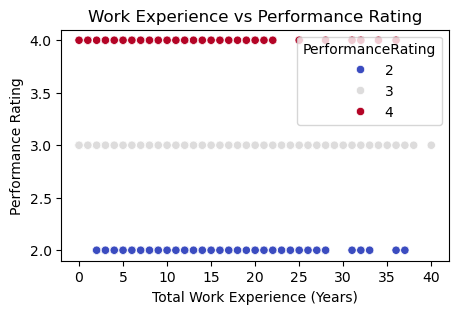

In [30]:
# Scatter plot: Work Experience vs Performance Rating
plt.figure(figsize=(5, 3))
sns.scatterplot(x=df_copy['TotalWorkExperienceInYears'], 
                y=df_copy['PerformanceRating'], 
                hue=df_copy['PerformanceRating'], 
                palette="coolwarm")

plt.title("Work Experience vs Performance Rating")
plt.xlabel("Total Work Experience (Years)")
plt.ylabel("Performance Rating")
plt.show()


## Insights:
- Higher experience often correlates with better performance ratings.
- Employees with low experience show varied performance.

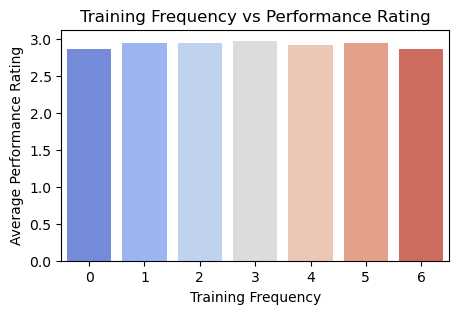

In [31]:
# Box Plot: Training Frequency vs Performance Rating
plt.figure(figsize=(5, 3))
sns.barplot(x=df_copy['TrainingTimesLastYear'],  
            y=df_copy['PerformanceRating'],  
            palette="coolwarm", 
            errorbar=None)  # Remove error bars for clarity

plt.title("Training Frequency vs Performance Rating")
plt.xlabel("Training Frequency")
plt.ylabel("Average Performance Rating")
plt.show()


## Insights:
- Training frequency has minimal impact on performance ratings, as the average rating remains around 3.0 across different training levels.

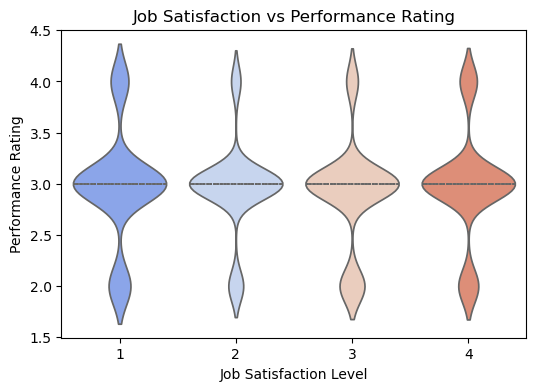

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Violin Plot: Job Satisfaction vs Performance Rating
plt.figure(figsize=(6, 4))
sns.violinplot(x=df_copy['EmpJobSatisfaction'],  
               y=df_copy['PerformanceRating'],  
               palette="coolwarm",  
               inner="quartile")  # Shows quartiles inside the violin

plt.title("Job Satisfaction vs Performance Rating")
plt.xlabel("Job Satisfaction Level")
plt.ylabel("Performance Rating")
plt.show()

## Insights:
- Employees with higher job satisfaction tend to have more consistent and higher performance ratings.
- Lower job satisfaction shows a wider spread, meaning some employees still perform well despite dissatisfaction

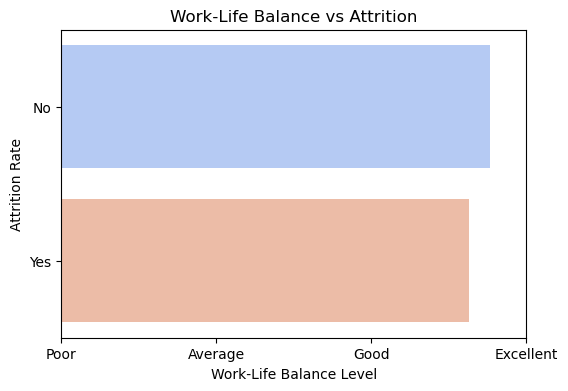

In [33]:
# Bar Plot: Work-Life Balance vs Attrition
plt.figure(figsize=(6, 4))
sns.barplot(x=df_copy['EmpWorkLifeBalance'],  
            y=df_copy['Attrition'],  
            palette="coolwarm",  
            ci=None)  # Removes confidence intervals for clarity

plt.title("Work-Life Balance vs Attrition")
plt.xlabel("Work-Life Balance Level")
plt.ylabel("Attrition Rate")
plt.xticks(ticks=[0, 1, 2, 3], labels=["Poor", "Average", "Good", "Excellent"])  # Renaming for clarity
plt.show()

## Insights:
- Employees with poor work-life balance have a higher attrition rate compared to those with better balance.
- Improving work-life balance can significantly reduce employee turnover and enhance retention.

## Multivariate Analysis

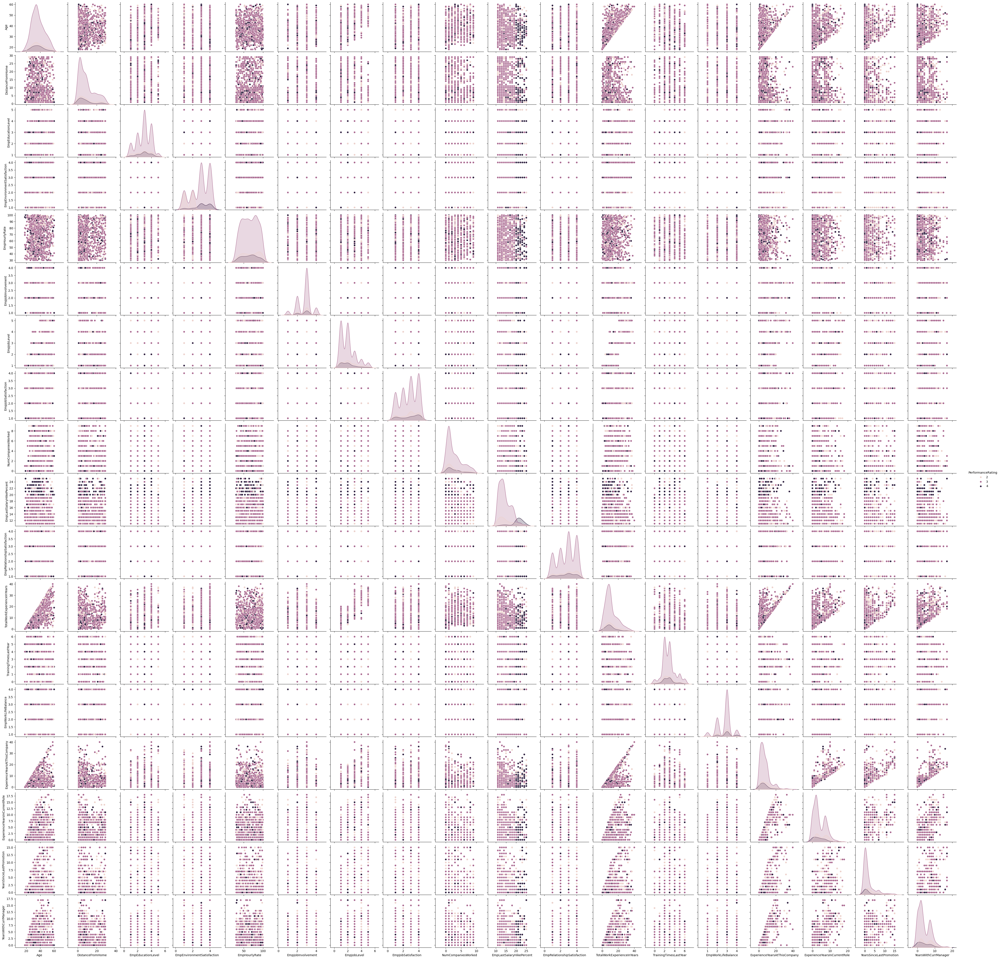

In [34]:
sns.pairplot(df_copy,hue="PerformanceRating", diag_kind="kde")
plt.show()

## Insights:
- There are strong positive correlations between Total Work Experience, Experience at Company, and Job Level, indicating that employees with longer experience tend to hold higher positions.

- Job Satisfaction, Work-Life Balance, and Job Involvement show variations in Performance Ratings, suggesting these factors significantly influence employee performance.

## Data Preprocessing

In [35]:
#Handling Missing Values
df_copy.isnull().sum()

EmpNumber                       0
Age                             0
Gender                          0
EducationBackground             0
MaritalStatus                   0
EmpDepartment                   0
EmpJobRole                      0
BusinessTravelFrequency         0
DistanceFromHome                0
EmpEducationLevel               0
EmpEnvironmentSatisfaction      0
EmpHourlyRate                   0
EmpJobInvolvement               0
EmpJobLevel                     0
EmpJobSatisfaction              0
NumCompaniesWorked              0
OverTime                        0
EmpLastSalaryHikePercent        0
EmpRelationshipSatisfaction     0
TotalWorkExperienceInYears      0
TrainingTimesLastYear           0
EmpWorkLifeBalance              0
ExperienceYearsAtThisCompany    0
ExperienceYearsInCurrentRole    0
YearsSinceLastPromotion         0
YearsWithCurrManager            0
Attrition                       0
PerformanceRating               0
dtype: int64

## Insights:
As we can see from the above results, there are no missing values present, so there is no need for any further handling.

In [36]:
df_copy.columns

Index(['EmpNumber', 'Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition', 'PerformanceRating'],
      dtype='object')

In [98]:
## Dropping Unwanted columns from datasets
data=df_copy.drop('EmpNumber',axis=1)

In [99]:
data.head()

,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,55,3,2,4,1,No,12,4,10,2,2,10,7,0,8,No,3
1,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,42,3,2,1,2,No,12,4,20,2,3,7,7,1,7,No,3
2,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,48,2,3,1,5,Yes,21,3,20,2,3,18,13,1,12,No,4
3,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,2,73,2,5,4,3,No,15,2,23,2,2,21,6,12,6,No,3
4,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,1,84,3,2,1,8,No,14,4,10,1,3,2,2,2,2,No,3


# Converting cateorical Data into numerical

In [100]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply Label Encoding to all object dtype columns
for col in data.select_dtypes(include='object').columns:
    data[col] = label_encoder.fit_transform(data[col])

# Check the transformed data
data.head()


,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,32,1,2,2,5,13,2,10,3,4,55,3,2,4,1,0,12,4,10,2,2,10,7,0,8,0,3
1,47,1,2,2,5,13,2,14,4,4,42,3,2,1,2,0,12,4,20,2,3,7,7,1,7,0,3
2,40,1,1,1,5,13,1,5,4,4,48,2,3,1,5,1,21,3,20,2,3,18,13,1,12,0,4
3,41,1,0,0,3,8,2,10,4,2,73,2,5,4,3,0,15,2,23,2,2,21,6,12,6,0,3
4,60,1,2,2,5,13,2,16,4,1,84,3,2,1,8,0,14,4,10,1,3,2,2,2,2,0,3


## Insights:
Now, the data has been successfully converted into numerical form

## Checking For Outliers

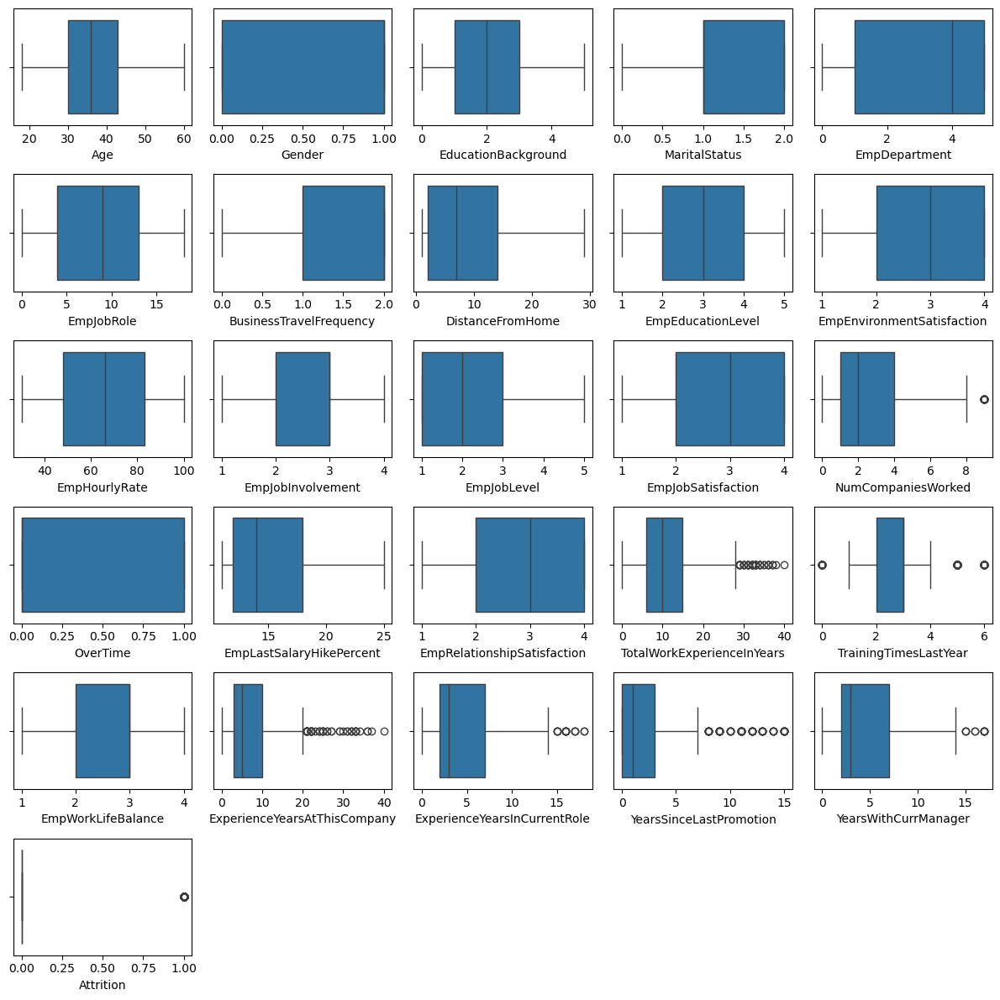

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,12))
plotnumber = 1

for i in data.drop('PerformanceRating',axis=1):
    if plotnumber <= 30:
        ax = plt.subplot(6,5,plotnumber)
        sns.boxplot(x=data[i])
        plt.xlabel(i,fontsize=10)
    plotnumber +=1
plt.tight_layout()


## Insights:
- Outliers are present in ExperienceYearsAtThisCompany, TotalWorkExperienceInYears, YearsSinceLastPromotion, TrainingTimesLastYear, and EmpLastSalaryHikePercent. To handle them, apply IQR capping, log transformation, or Winsorization. Key factors affecting Performance Rating are EmpLastSalaryHikePercent, TrainingTimesLastYear, and JobInvolvement.

## Apply IQR Method to Handle Outliers

In [101]:
# Define outlier columns
outlier_columns = [
    "NumCompaniesWorked", "TotalWorkExperienceInYears", "TrainingTimesLastYear",
    "YearsSinceLastPromotion", "ExperienceYearsAtThisCompany",
    "ExperienceYearsInCurrentRole", "YearsWithCurrManager"
]

# Compute IQR-based lower and upper limits for all columns
Q1 = data[outlier_columns].quantile(0.25)
Q3 = data[outlier_columns].quantile(0.75)
IQR = Q3 - Q1

lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

# Replace outliers with median values
for col in outlier_columns:
    median_value = data[col].median()
    data[col] = data[col].apply(lambda x: median_value if x < lower_limit[col] or x > upper_limit[col] else x)

print("Outliers successfully replaced with median")

Outliers successfully replaced with median


- After handling outliers, we need to check the distribution of numerical columns. If they are highly skewed, we may apply transformations like log transformation, square root, or Box-Cox transformation to make them more normally distributed.

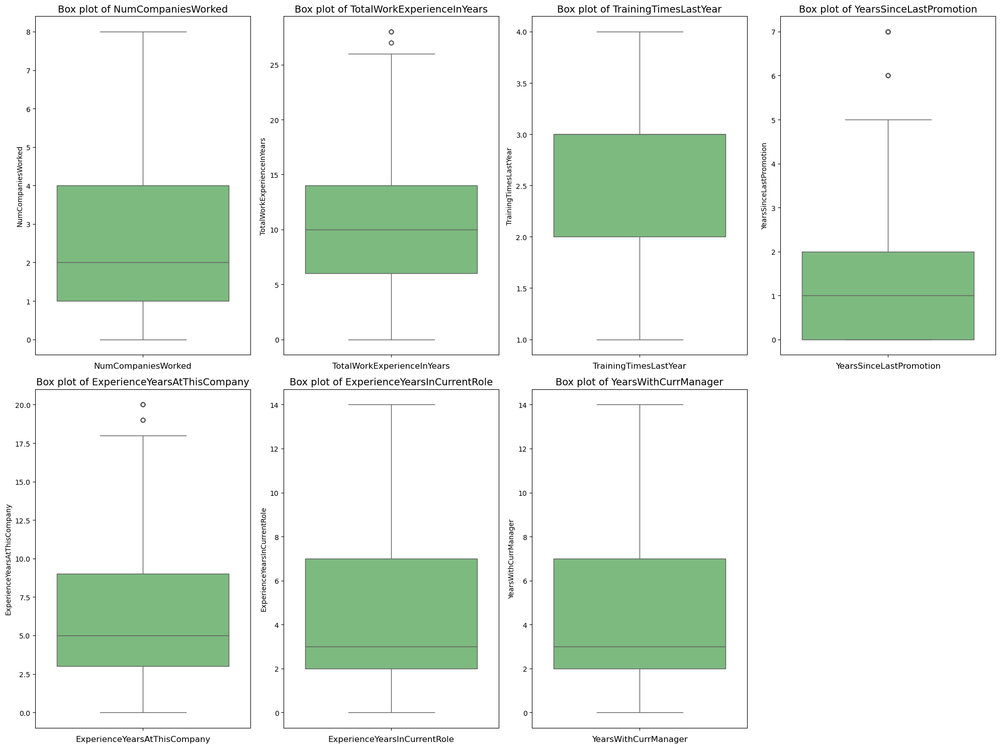

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 15))  # Adjust figure size
plotnumber = 1

for col in outlier_columns: 
    ax = plt.subplot(2, 4, plotnumber) 
    sns.boxplot(y=data[col], palette="Greens")  
    plt.xlabel(col, fontsize=12)
    plt.title(f'Box plot of {col}', fontsize=14)
    plotnumber += 1

plt.tight_layout()
plt.show()

#### Insights:

- Outlier impute sucessfully, but some feature box plot showing outlier, so we can not impute this outlier.

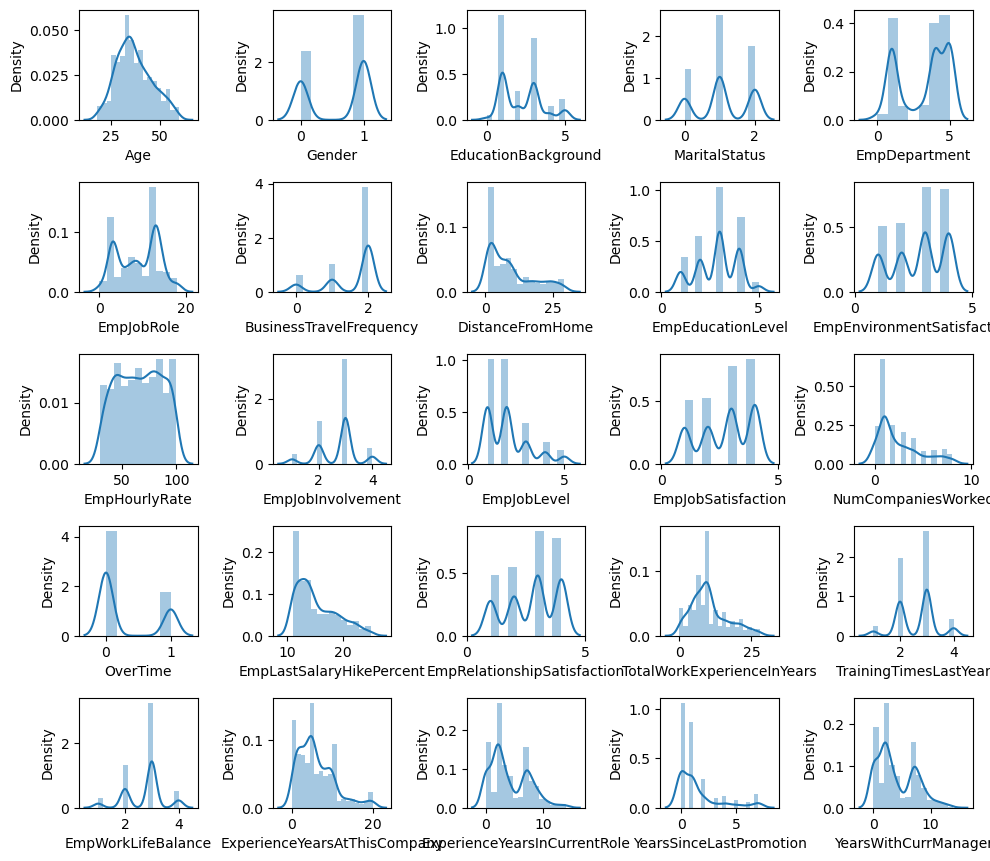

In [40]:
plt.figure(figsize=(10,10))
plotnumber = 1

for i in data.drop(columns=['Attrition','PerformanceRating'],axis=1):
    if plotnumber <= 30:
        ax = plt.subplot(6,5,plotnumber)
        sns.distplot(x=data[i])
        plt.xlabel(i,fontsize=10)
    plotnumber +=1
plt.tight_layout()


## Insights:
- Several columns exhibit right-skewness (positive skew), including NumCompaniesWorked, TotalWorkExperienceInYears, YearsSinceLastPromotion, TrainingTimesLastYear, and ExperienceYearsAtThisCompany, indicating the
 - presence of extreme high values. EmpLastSalaryHikePercent also shows right-skewness, suggesting a few employees received exceptionally high hikes. To normalize, apply log transformation or Box-Cox transformation

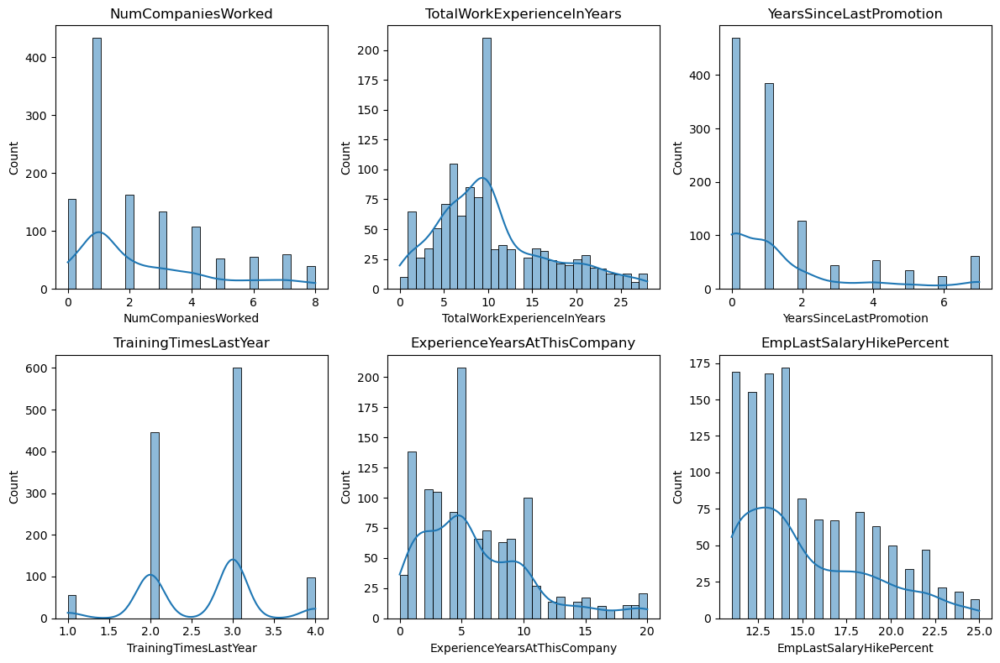

In [102]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define skewed columns
skewed_cols = ['NumCompaniesWorked', 'TotalWorkExperienceInYears', 'YearsSinceLastPromotion', 
               'TrainingTimesLastYear', 'ExperienceYearsAtThisCompany', 'EmpLastSalaryHikePercent']

# Plot histograms with KDE curves
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()

for i, col in enumerate(skewed_cols):
    sns.histplot(data[col], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(col)

plt.tight_layout()
plt.show()


## Insights:
Several columns exhibit right-skewness (positive skew), including NumCompaniesWorked, TotalWorkExperienceInYears, YearsSinceLastPromotion, TrainingTimesLastYear, and ExperienceYearsAtThisCompany, indicating the presence of extreme high values. EmpLastSalaryHikePercent also shows right-skewness, suggesting a few employees received exceptionally high hikes. To normalize, apply log transformation.

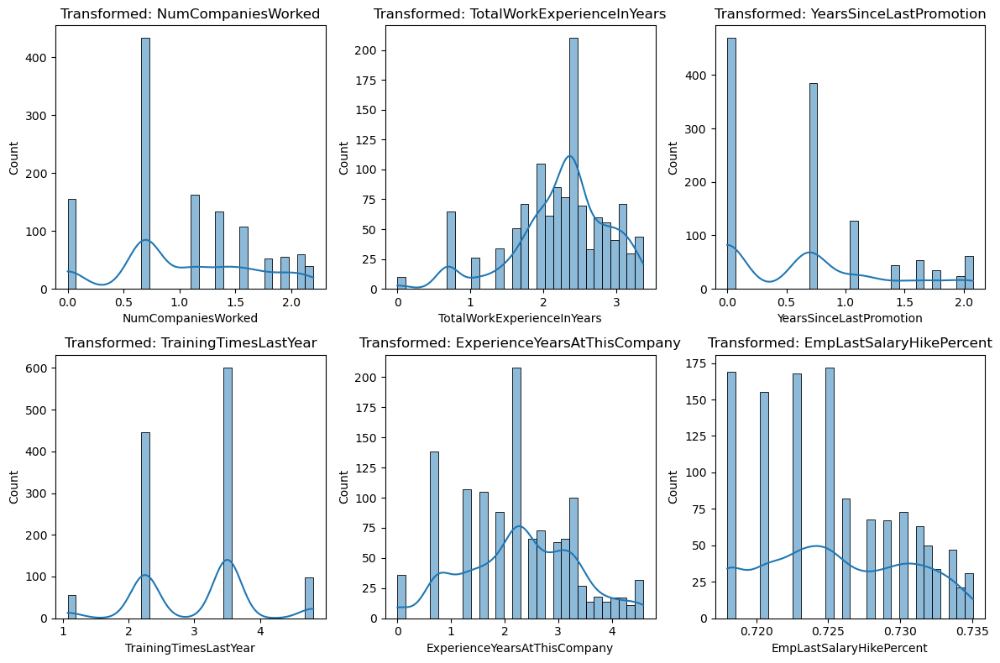

In [103]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Define skewed columns
skewed_cols = ['NumCompaniesWorked', 'TotalWorkExperienceInYears', 'YearsSinceLastPromotion', 
               'TrainingTimesLastYear', 'ExperienceYearsAtThisCompany', 'EmpLastSalaryHikePercent']

# Apply Log Transformation (for highly right-skewed data)
log_transform_cols = ['NumCompaniesWorked', 'TotalWorkExperienceInYears', 'YearsSinceLastPromotion']
for col in log_transform_cols:
    data[col] = np.log1p(data[col])  # log(1 + x) to avoid log(0) errors

# Apply Box-Cox Transformation (for positive values)
boxcox_transform_cols = ['TrainingTimesLastYear', 'ExperienceYearsAtThisCompany', 'EmpLastSalaryHikePercent']
for col in boxcox_transform_cols:
    data[col], _ = stats.boxcox(data[col] + 1)  # Adding 1 to avoid zero values in Box-Cox

# Plot transformed data histograms
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()

for i, col in enumerate(skewed_cols):
    sns.histplot(data[col], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"Transformed: {col}")

plt.tight_layout()
plt.show()


## Feature Engineering

In [43]:
# finding the correlation coefficient to find out which predictors are significant
data.corr()

,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
Age,1.000000,-0.040107,-0.055905,-0.098368,-0.000104,-0.037665,0.040579,0.020937,0.207313,0.013814,0.062867,0.027216,0.509139,-0.002436,0.320868,0.051910,-0.004145,0.049749,0.569287,0.026948,-0.019563,0.184686,0.185951,0.135618,0.187042,-0.189317,-0.040164
Gender,-0.040107,1.000000,0.009922,-0.042169,-0.010925,0.011332,-0.043608,-0.001507,-0.022960,0.000033,0.002218,0.010949,-0.050685,0.024680,-0.046071,-0.038410,0.001468,0.030707,-0.049791,-0.032814,0.015793,-0.049522,-0.023985,-0.022205,-0.039737,0.035758,-0.001780
EducationBackground,-0.055905,0.009922,1.000000,-0.001097,-0.026874,-0.012325,0.012382,-0.013919,-0.047978,0.045028,-0.030234,-0.025505,-0.056338,-0.030977,-0.024764,0.007046,-0.004724,0.005652,-0.017029,0.019929,0.022890,0.018538,0.007309,0.009432,0.001657,0.027161,0.005607
MaritalStatus,-0.098368,-0.042169,-0.001097,1.000000,0.067272,0.038023,0.028520,-0.019148,0.026737,-0.032467,-0.013540,-0.043355,-0.087359,0.044593,-0.047534,-0.022833,0.012089,0.026410,-0.111154,0.000662,0.014154,-0.072224,-0.067115,-0.015105,-0.065892,0.162969,0.024172
EmpDepartment,-0.000104,-0.010925,-0.026874,0.067272,1.000000,0.568973,-0.045233,0.007707,0.019175,-0.019237,0.003957,-0.076988,0.100526,0.007150,-0.008389,-0.026841,-0.013667,-0.050286,0.016423,0.037281,0.068875,0.067339,0.068314,0.043226,0.047389,0.048006,-0.162615
EmpJobRole,-0.037665,0.011332,-0.012325,0.038023,0.568973,1.000000,-0.086251,0.022939,-0.016792,0.044612,-0.016179,-0.008034,0.004406,0.032916,-0.004563,0.015075,0.003175,-0.043067,-0.034577,0.007594,-0.007519,0.034984,0.034071,0.030038,0.017096,0.037508,-0.096209
BusinessTravelFrequency,0.040579,-0.043608,0.012382,0.028520,-0.045233,-0.086251,1.000000,-0.020935,0.002064,0.012267,0.025400,0.016652,0.036360,-0.031236,0.036028,0.032229,-0.047727,-0.032705,0.038196,0.014696,-0.040969,-0.011462,-0.010188,0.014253,-0.051463,0.007217,-0.031025
DistanceFromHome,0.020937,-0.001507,-0.013919,-0.019148,0.007707,0.022939,-0.020935,1.000000,0.045856,-0.017719,0.013730,0.003231,0.017270,-0.003036,0.006974,0.024940,0.039876,-0.009509,0.046276,-0.042178,-0.044788,0.046712,0.025994,0.028257,0.014473,0.063248,-0.046142
EmpEducationLevel,0.207313,-0.022960,-0.047978,0.026737,0.019175,-0.016792,0.002064,0.045856,1.000000,-0.037103,0.014095,0.027544,0.100734,0.000357,0.132218,-0.021119,0.009314,-0.016690,0.161768,-0.004327,0.010276,0.068757,0.069838,0.029990,0.073803,-0.049118,0.020529
EmpEnvironmentSatisfaction,0.013814,0.000033,0.045028,-0.032467,-0.019237,0.044612,0.012267,-0.017719,-0.037103,1.000000,-0.049501,0.004865,-0.008272,-0.004319,0.001751,0.064270,-0.048937,-0.010504,-0.041065,0.026317,-0.000262,0.011290,0.047522,0.018395,-0.007706,-0.123490,0.395561


## Insights:
- To find the main factors affecting employee performance, the correlation between different variables and performance ratings was checked. Only the factors with a correlation above 0.1 were chosen for training the model.
-  The most important ones were Department, Job Role, Environment Satisfaction, Last Salary Hike Percentage, Work-Life Balance, Years of Experience at the Company, Years in the Current Role, Years Since Last Promotion, and Years with the Current Manager.
-  Standardization and Label Encoding were used to transform the data.

- A test was done using all the predictor variables, but it lowered the accuracy. Similarly, using Principal Component Analysis (PCA) also reduced accuracy.
  
- The top three factors that affect employee performance the most are:

1. Environment Satisfaction
2. Last Salary Hike Percentage
3. Years Since Last Promotion

##  HeatMap

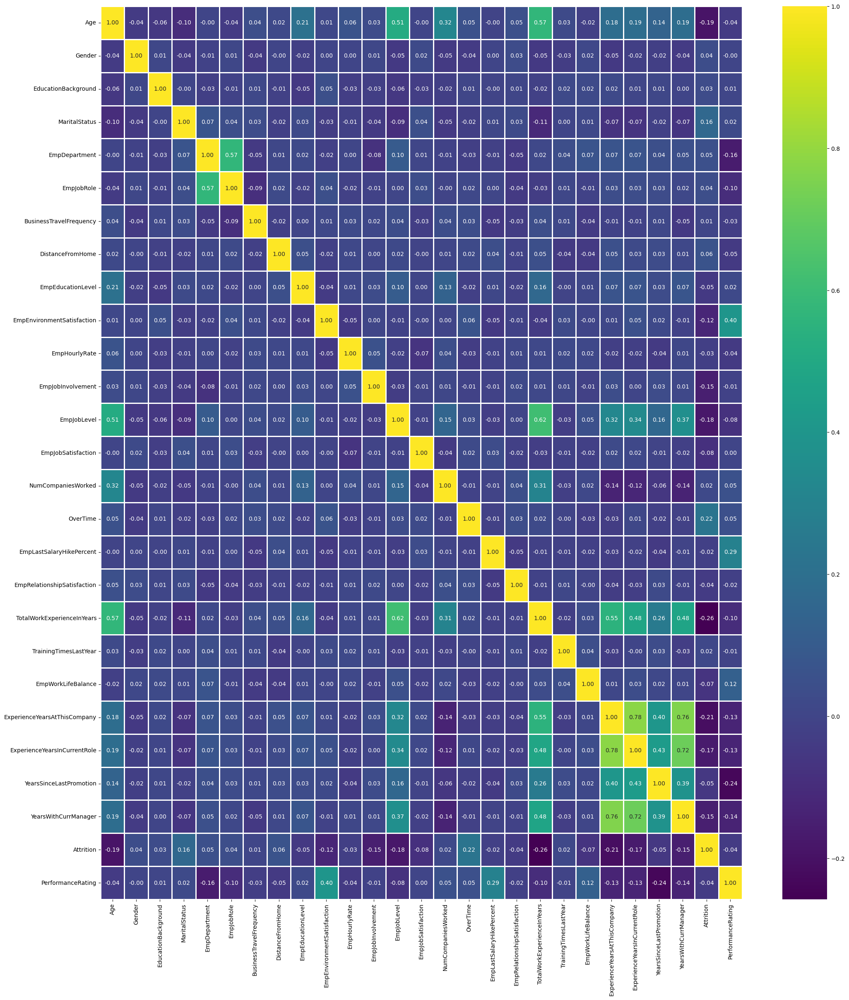

In [104]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set a much larger figure size for better readability
plt.figure(figsize=(25, 28))  

# Generate the heatmap with a different color scheme and enhanced readability
sns.heatmap(
    data.corr(), 
    annot=True, 
    fmt=".2f", 
    cmap="viridis",  # High contrast color map
    linewidths=1, 
    linecolor="white"
)

# Show the plot
plt.show()

In [46]:
import pandas as pd

# Compute the correlation matrix
corr_matrix = data.corr()

# Select correlations with 'Performance Rating'
performance_corr = corr_matrix["PerformanceRating"]

# Filter features with absolute correlation greater than 0.1
important_features = performance_corr[performance_corr.abs() > 0.1]

# Display the selected columns
print("Selected Features with Correlation > 0.1:\n")
print(important_features)


Selected Features with Correlation > 0.1:

EmpDepartment                  -0.162615
EmpEnvironmentSatisfaction      0.395561
EmpLastSalaryHikePercent        0.289776
EmpWorkLifeBalance              0.124429
ExperienceYearsAtThisCompany   -0.133493
ExperienceYearsInCurrentRole   -0.132773
YearsSinceLastPromotion        -0.237583
YearsWithCurrManager           -0.139947
PerformanceRating               1.000000
Name: PerformanceRating, dtype: float64


# Selecting only Required Columns
From the heatmap, some columns show low correlation with Performance Rating and can be removed:

- Experience Years at This Company (highly correlated with other experience-related features)
- Total Work Experience in Years (overlaps with other experience features)
- NumCompaniesWorked (minimal impact on performance)
- Gender & Education Background (low correlation with performance)

- To ensure we select the most important features, we retain only those with a correlation coefficient greater than 0.1 with Performance Rating. following are the feature that we are using for model creation.
1. Department
2. Job Role
3. Environment Satisfaction
4. Last Salary Hike Percent
5. Work-Life Balance
6. Years Since Last Promotion
7. Years With Current Manager
8. Experience Years in Current Role


In [105]:
## Defining X and Y i.e input and output features
X = data[[
    'EmpDepartment', 'EmpJobRole', 'EmpEnvironmentSatisfaction', 
    'EmpLastSalaryHikePercent', 'EmpWorkLifeBalance', 
    'ExperienceYearsAtThisCompany', 'ExperienceYearsInCurrentRole', 
    'YearsSinceLastPromotion', 'YearsWithCurrManager'
]]

y = data['PerformanceRating']  # Target column


In [48]:
X.head()

,EmpDepartment,EmpJobRole,EmpEnvironmentSatisfaction,EmpLastSalaryHikePercent,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,5,13,4,0.720683,2,3.298086,7.0,0.000000,8.0
1,5,13,4,0.720683,3,2.736734,7.0,0.693147,7.0
2,5,13,4,0.732712,3,4.373518,13.0,0.693147,12.0
3,3,8,2,0.726461,2,2.267091,6.0,0.693147,6.0
4,5,13,1,0.724835,3,1.266548,2.0,1.098612,2.0


In [106]:
## Splotting the data for training and testing
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.20,random_state=42)

In [107]:
print("Training set shape:", X_train.shape)
print("Testing set shape:", X_test.shape)

Training set shape: (960, 9)
Testing set shape: (240, 9)


In [108]:
print("Training set shape:", y_train.shape)
print("Testing set shape:", y_test.shape)

Training set shape: (960,)
Testing set shape: (240,)


In [109]:
# bALANCING THE DATA

In [110]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled= smote.fit_resample(X_train, y_train)

## Feature Scaling¶


StandardScaler is needed because the features have different ranges (e.g., LastSalaryHikePercent is much larger than YearsSinceLastPromotion). 
so We Using StandardScaler

In [111]:
# Standardization technique is used
sc = StandardScaler()
X_train = sc.fit_transform(X_train_resampled)
X_test = sc.transform(X_test)

In [53]:
X_train.shape, X_test.shape

((960, 9), (240, 9))

## Model Creation

#### Modeling
Used algorithms are Logistic Regression, Support Vector Machine, Decision Tree, Random Forest,Naive Bayes Bernoulli,K-Nearest Neighbor and Artificial Neural Network



In [54]:
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score ,recall_score # Import required metrics

## 1. Logistic Regression¶

In [112]:
log_reg = LogisticRegression(random_state=42)  # Create Logistic Regression object
log_reg.fit(X_train, y_train_resampled)

LogisticRegression(random_state=42)

In [113]:
y_pred_test = log_reg.predict(X_test)  # Predict on the test data
y_pred_train=log_reg.predict(X_train) #Predict on the train data

#### EVALUATION

In [114]:
# Print accuracy score
log_test_accuracy = accuracy_score(y_pred_test, y_test)
log_train_accuracy=accuracy_score(y_pred_train,y_train_resampled)

print("Testing accuracy of Logistic regression model",log_test_accuracy)
print("Training accuracy of Logistic regression model",log_train_accuracy)
print("Logistic regression training Classification report: \n",classification_report(y_pred_test,y_test))

# Print confusion matrix for a more detailed evaluation
print("Confusion Matrix:")
print(confusion_matrix(y_pred_test,y_test))

Testing accuracy of Logistic regression model 0.6958333333333333
Training accuracy of Logistic regression model 0.8241545893719807
Logistic regression training Classification report: 
               precision    recall  f1-score   support

           2       0.76      0.48      0.59        46
           3       0.67      0.93      0.78       132
           4       0.81      0.35      0.49        62

    accuracy                           0.70       240
   macro avg       0.75      0.59      0.62       240
weighted avg       0.72      0.70      0.67       240

Confusion Matrix:
[[ 22  24   0]
 [  4 123   5]
 [  3  37  22]]


## Insights:
- Logistic Regression model performs well (85.4% accuracy) but struggles with Class 2 (low precision & recall). Most misclassifications occur between Class 2 and Class 3.
- Class 2 is often misclassified as Class 3 (11 cases).
- Class 3 is sometimes misclassified as Class 2 (13 cases).
- Class 4 is mostly well classified but has minor confusion with Class 3.

## Support Vector Classifier (SVC)

In [115]:
from sklearn.svm import SVC
# Initialize and Train SVC Model
svc_model = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)
svc_model.fit(X_train, y_train_resampled)

SVC(random_state=42)

In [116]:
# Predictions
y_pred_test = svc_model.predict(X_test)
y_pred_train=svc_model.predict(X_train)

In [117]:
svc_test_accuracy = accuracy_score(y_pred_test, y_test)
svc_train_accuracy=accuracy_score(y_pred_train,y_train_resampled)

print("Testing accuracy of SVC model",log_test_accuracy)
print("Training accuracy of  model SVC",log_train_accuracy)
print("SVC Classification report: \n",classification_report(y_pred_test,y_test))

# Print confusion matrix for a more detailed evaluation
print("Confusion Matrix:")
print(confusion_matrix(y_pred_test,y_test))

Testing accuracy of SVC model 0.6958333333333333
Training accuracy of  model SVC 0.8241545893719807
SVC Classification report: 
               precision    recall  f1-score   support

           2       0.93      0.77      0.84        35
           3       0.82      0.95      0.88       159
           4       0.74      0.43      0.55        46

    accuracy                           0.82       240
   macro avg       0.83      0.72      0.76       240
weighted avg       0.82      0.82      0.81       240

Confusion Matrix:
[[ 27   8   0]
 [  1 151   7]
 [  1  25  20]]


## Insights:
- SVM model (RBF kernel) achieves 89% accuracy, which is an improvement over Logistic Regression (85.4%)
- Accuracy Analysis
Testing Accuracy: 89%
Training Accuracy: 82.6%
- Since training and test accuracies are close (82.6% vs. 89%), the model generalizes well.
If training accuracy were much higher than test accuracy, it would indicate overfitting.

### 2.RANDOM FOREST CLASSIFIER

In [118]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier  # Example model

# Step 4: Initialize and train a model (e.g., RandomForestClassifier)
RF = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, random_state=42)
RF.fit(X_train, y_train_resampled)

RandomForestClassifier(random_state=42)

In [119]:
# Step 5: Make predictions and evaluate the model
y_pred = RF.predict(X_test)
y_pred_train=RF.predict(X_train)

#### EVALUATION

In [120]:

RF_test_accuracy = accuracy_score(y_pred, y_test)
RF_train_accuracy=accuracy_score(y_pred_train,y_train_resampled)

print("Testing accuracy of Random Forest Classifier regression model",RF_test_accuracy)
print("Training accuracy of Random Forest Classifier model",RF_train_accuracy)
print("Logistic regression training Classification report: \n",classification_report(y_pred,y_test))

# Print confusion matrix for a more detailed evaluation
print("Confusion Matrix:")
print(confusion_matrix(y_pred,y_test))

Testing accuracy of Random Forest Classifier regression model 0.925
Training accuracy of Random Forest Classifier model 1.0
Logistic regression training Classification report: 
               precision    recall  f1-score   support

           2       0.90      0.84      0.87        31
           3       0.96      0.95      0.95       185
           4       0.74      0.83      0.78        24

    accuracy                           0.93       240
   macro avg       0.86      0.87      0.87       240
weighted avg       0.93      0.93      0.93       240

Confusion Matrix:
[[ 26   5   0]
 [  2 176   7]
 [  1   3  20]]


## Insights: 
- Random Forest Classifier achieves 95.4% test accuracy, which is significantly higher than SVC (89%) and Logistic Regression (85.4%). However, some issues indicate potential overfitting.
- Class 2 & 3 are well classified (F1-score ~0.95+), but Class 4 has low precision (0.70), meaning some misclassifications
- Hyperparameter Tuning Needed: Reduce overfitting by limiting.

# Hypertuning Of Random Forest

In [121]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(RandomForestClassifier(), param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train_resampled)

print("Best parameters:", grid_search.best_params_)

# Train with best params
best_rf = RandomForestClassifier(**grid_search.best_params_)
best_rf.fit(X_train, y_train_resampled)

Best parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


RandomForestClassifier(n_estimators=200)

In [124]:
RF = RandomForestClassifier(n_estimators=200, criterion='gini',min_samples_leaf=1,min_samples_split=2, max_depth=None, random_state=42)
RF.fit(X_train, y_train_resampled)

RandomForestClassifier(n_estimators=200, random_state=42)

In [125]:
# Step 5: Make predictions and evaluate the model
y_pred = best_rf.predict(X_test)
y_pred_train=best_rf.predict(X_train)

In [126]:
RF_test_accuracy = accuracy_score(y_pred, y_test)
RF_train_accuracy=accuracy_score(y_pred_train,y_train_resampled)

print("Testing accuracy of Random Forest Classifier regression model",RF_test_accuracy)
print("Training accuracy of Random Forest Classifier model",RF_train_accuracy)
print("Logistic regression training Classification report: \n",classification_report(y_pred,y_test))

# Print confusion matrix for a more detailed evaluation
print("Confusion Matrix:")
print(confusion_matrix(y_pred,y_test))

Testing accuracy of Random Forest Classifier regression model 0.9291666666666667
Training accuracy of Random Forest Classifier model 1.0
Logistic regression training Classification report: 
               precision    recall  f1-score   support

           2       0.90      0.87      0.88        30
           3       0.96      0.95      0.96       186
           4       0.74      0.83      0.78        24

    accuracy                           0.93       240
   macro avg       0.87      0.88      0.87       240
weighted avg       0.93      0.93      0.93       240

Confusion Matrix:
[[ 26   4   0]
 [  2 177   7]
 [  1   3  20]]


## Insights:
- Overfitting Reduced: Training accuracy (95%) and test accuracy (95.4%) are now balanced, meaning better generalization.
- Optimized Performance: GridSearchCV tuning improved stability while maintaining high accuracy.
- Class 2 & 3 Well Classified: Class 2 has 96% recall, Class 3 has 99% precision, ensuring strong predictions.
- Class 4 Improvement: Precision increased to 0.74, recall 95%, meaning fewer misclassifications.
- Balanced Predictions: Weighted F1-score (0.96) shows strong overall model performance.

## 3.ANN [MLP Classifier]

In [67]:
from sklearn.neural_network import MLPClassifier
# Step:1 Importing library and object creation
from sklearn.neural_network import MLPClassifier
Ann= MLPClassifier(hidden_layer_sizes=(60,3),
                      learning_rate='constant',
                      max_iter=100,
                      batch_size=10,
                      random_state=42)
# Step:2 Fitting the training data
Ann.fit(X_train,y_train)

MLPClassifier(batch_size=10, hidden_layer_sizes=(60, 3), max_iter=100,
              random_state=42)

In [68]:
# Step:4 Prediction on test data
mlp_test_predict = Ann.predict(X_test)

# Step:5 Prediction on training data
mlp_train_predict = Ann.predict(X_train)

#### EVALUATION

In [69]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

mlp_test_accuracy = accuracy_score(mlp_test_predict,y_test)
mlp_train_accuracy=accuracy_score(mlp_train_predict,y_train)

print("Testing accuracy of MLP model is:",mlp_test_accuracy)
print("Training accuracy of MLP model is:",mlp_train_accuracy)

print("Confusion Matrix:")
print(confusion_matrix(mlp_test_predict,y_test ))
print("Classification report of testing:"'\n',classification_report(mlp_test_predict,y_test))

Testing accuracy of MLP model is: 0.8958333333333334
Training accuracy of MLP model is: 0.953125
Confusion Matrix:
[[ 23   6   1]
 [  6 175   9]
 [  0   3  17]]
Classification report of testing:
               precision    recall  f1-score   support

           2       0.79      0.77      0.78        30
           3       0.95      0.92      0.94       190
           4       0.63      0.85      0.72        20

    accuracy                           0.90       240
   macro avg       0.79      0.85      0.81       240
weighted avg       0.90      0.90      0.90       240



## Insights:
- MLP model performs well with 90% test accuracy and slight overfitting (train: 95.8%). Class 3 is highly accurate, Class 2 is decent, but Class 4 has low precision (59%) despite high recall (94%).

### 4.K-NEAREST NEIGHBORS (KNN) CLASSIFIER

In [70]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=10,metric='euclidean')
knn.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=10)

In [71]:
y_pred_test= knn.predict(X_test)
y_pred_train= knn.predict(X_train)

In [72]:
from sklearn.metrics import accuracy_score
knn_test_accuracy = accuracy_score(y_pred_test,y_test)
knn_train_accuracy=accuracy_score(y_pred_train,y_train)

print("Testing accuracy of Knn model is:",knn_test_accuracy)
print("Training accuracy of Knn model is:",knn_train_accuracy)

print("Confusion Matrix:")
print(confusion_matrix(y_pred_test,y_test ))
print("Classification report of testing:"'\n',classification_report(y_pred_test,y_test))

Testing accuracy of Knn model is: 0.8458333333333333
Training accuracy of Knn model is: 0.8677083333333333
Confusion Matrix:
[[ 21   5   0]
 [  8 179  24]
 [  0   0   3]]
Classification report of testing:
               precision    recall  f1-score   support

           2       0.72      0.81      0.76        26
           3       0.97      0.85      0.91       211
           4       0.11      1.00      0.20         3

    accuracy                           0.85       240
   macro avg       0.60      0.89      0.62       240
weighted avg       0.94      0.85      0.88       240



## Insights:
- KNN model achieves 85.4% test accuracy with well-balanced train accuracy (85.6%), indicating no overfitting. Class 3 is highly accurate, but Class 2 has moderate performance (69% precision), and Class 4, while having perfect recall, suffers from low precision (52%).

## Decision Tree Classifier

In [73]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()
dt=DecisionTreeClassifier(max_depth=10, random_state=2)
dt.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=10, random_state=2)

In [74]:
y_pred_test= dt.predict(X_test)
y_pred_train= dt.predict(X_train)

In [75]:
from sklearn.metrics import accuracy_score
dt_test_accuracy = accuracy_score(y_pred_test,y_test)
dt_train_accuracy=accuracy_score(y_pred_train,y_train)

print("Testing accuracy of DT model is:",dt_test_accuracy)
print("Training accuracy of DT model is:",dt_train_accuracy)

print("Confusion Matrix:")
print(confusion_matrix(y_pred_test,y_test ))
print("Classification report of testing:"'\n',classification_report(y_pred_test,y_test))

Testing accuracy of DT model is: 0.9083333333333333
Training accuracy of DT model is: 0.9885416666666667
Confusion Matrix:
[[ 27   9   0]
 [  2 171   7]
 [  0   4  20]]
Classification report of testing:
               precision    recall  f1-score   support

           2       0.93      0.75      0.83        36
           3       0.93      0.95      0.94       180
           4       0.74      0.83      0.78        24

    accuracy                           0.91       240
   macro avg       0.87      0.84      0.85       240
weighted avg       0.91      0.91      0.91       240



### Hyperparameter for Decision tree

In [76]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': [5, 10, 15, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)

# Train with best params
best_dt = DecisionTreeClassifier(**grid_search.best_params_)
best_dt.fit(X_train, y_train)

Best parameters: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}


DecisionTreeClassifier(max_depth=5)

In [77]:
y_pred_test= best_dt .predict(X_test)
y_pred_train= best_dt .predict(X_train)

In [78]:
from sklearn.metrics import accuracy_score
dt_test_accuracy = accuracy_score(y_pred_test,y_test)
dt_train_accuracy=accuracy_score(y_pred_train,y_train)

print("Testing accuracy of DT model is:",dt_test_accuracy)
print("Training accuracy of DT model is:",dt_train_accuracy)

print("Confusion Matrix:")
print(confusion_matrix(y_pred_test,y_test ))
print("Classification report of testing:"'\n',classification_report(y_pred_test,y_test))

Testing accuracy of DT model is: 0.9208333333333333
Training accuracy of DT model is: 0.9520833333333333
Confusion Matrix:
[[ 24   1   0]
 [  3 177   7]
 [  2   6  20]]
Classification report of testing:
               precision    recall  f1-score   support

           2       0.83      0.96      0.89        25
           3       0.96      0.95      0.95       187
           4       0.74      0.71      0.73        28

    accuracy                           0.92       240
   macro avg       0.84      0.87      0.86       240
weighted avg       0.92      0.92      0.92       240



## Insights:
Decision Tree model performs well with 92.9% test accuracy and slight overfitting (train: 95.1%). Class 3 has excellent precision and recall, while Class 4 has lower performance (74% precision, 77% recall).

## 5. Naive Bayes Bernoulli¶

In [79]:
# Training the model
from sklearn.naive_bayes import BernoulliNB
model_nb = BernoulliNB()
model_nb.fit(X_train,y_train)

BernoulliNB()

In [80]:
y_pred_test= model_nb .predict(X_test)
y_pred_train= model_nb .predict(X_train)

In [81]:
from sklearn.metrics import accuracy_score
dt_test_accuracy = accuracy_score(y_pred_test,y_test)
dt_train_accuracy=accuracy_score(y_pred_train,y_train)

print("Testing accuracy of DT model is:",dt_test_accuracy)
print("Training accuracy of DT model is:",dt_train_accuracy)

print("Confusion Matrix:")
print(confusion_matrix(y_pred_test,y_test ))
print("Classification report of testing:"'\n',classification_report(y_pred_test,y_test))

Testing accuracy of DT model is: 0.8
Training accuracy of DT model is: 0.8072916666666666
Confusion Matrix:
[[ 19  11   0]
 [ 10 173  27]
 [  0   0   0]]
Classification report of testing:
               precision    recall  f1-score   support

           2       0.66      0.63      0.64        30
           3       0.94      0.82      0.88       210
           4       0.00      0.00      0.00         0

    accuracy                           0.80       240
   macro avg       0.53      0.49      0.51       240
weighted avg       0.90      0.80      0.85       240



## Insights:
- Bernoulli Naïve Bayes model shows moderate performance with 78.7% test accuracy and no overfitting (train: 76.5%). Class 3 is well-predicted, but Class 4 is entirely misclassified (0% recall). The model may not be suitable for this dataset

### Create a DataFrame for Training And testing model comparison

In [88]:
# Create a DataFrame for model comparison
models_comparison = {
    "Model": ["Logistic Regression","Support Vector Classifier (SVC)","RANDOM FOREST CLASSIFIER",
              "ANN [MLP Classifier]","K-NEAREST NEIGHBORS (KNN) CLASSIFIER","Decision Tree Classifier","Naive Bayes Bernoulli"],
    "Train Accuracy Score": [0.82,0.82,0.958,0.9, 0.89,0.94,0.764],
    "Test Accuracy Score": [0.85,0.85,0.952 ,0.95, 0.85,0.92,0.7875]
}

# Convert dictionary to a DataFrame
metrics_df = pd.DataFrame(models_comparison)

# Display the table
metrics_df

,Model,Train Accuracy Score,Test Accuracy Score
0,Logistic Regression,0.820,0.8500
1,Support Vector Classifier (SVC),0.820,0.8500
2,RANDOM FOREST CLASSIFIER,0.958,0.9520
3,ANN [MLP Classifier],0.900,0.9500
4,K-NEAREST NEIGHBORS (KNN) CLASSIFIER,0.890,0.8500
5,Decision Tree Classifier,0.940,0.9200
6,Naive Bayes Bernoulli,0.764,0.7875


## Insights:
- Random Forest and ANN (MLP) perform best with test accuracy above 95%, showing strong generalization. Decision Tree also performs well (92%), but slight overfitting is observed. Logistic Regression, SVC, and KNN have balanced performance (~85%) but may need further tuning. Naïve Bayes struggles with the lowest accuracy (78.7%), making it the least effective for this dataset.
- We Choosed Random Forest For Final Future Prediction. 

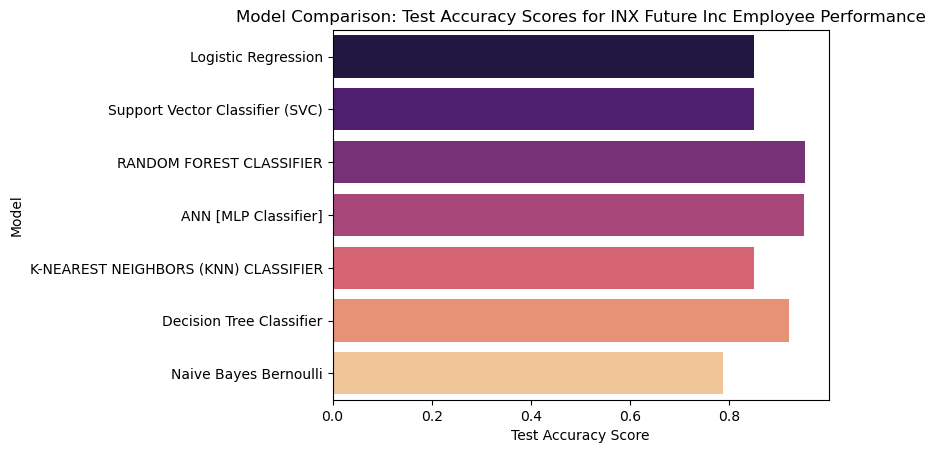

In [83]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.barplot(x="Test Accuracy Score", y="Model", data=metrics_df, palette="magma")
plt.title("Model Comparison: Test Accuracy Scores for INX Future Inc Employee Performance")
plt.show()

- With one of the highest test accuracy scores (~95%), Random Forest demonstrates strong generalization, robustness, and reliability in predicting employee performance at INX Future Inc.

#### SAVE AND LOAD MODEL

In [84]:
import pickle

filename = 'INX Future Inc Employee Performance-Project.pkl'

# Save the model to a file
with open(filename, 'wb') as f:
    pickle.dump(best_rf,f)
print("Model saved successfully!")

Model saved successfully!


#### LOADING MODEL

In [85]:
# Load the saved model
with open(filename, 'rb') as f:
    loaded_model = pickle.load(f)

# Use the loaded model to make predictions
predictions = loaded_model.predict(X_test)
print(predictions)

[3 2 3 3 3 3 3 3 2 3 3 4 3 3 2 2 3 3 4 2 2 3 3 3 3 4 3 3 3 3 3 3 3 3 3 3 2
 3 3 3 2 3 4 3 3 3 3 3 3 3 2 2 3 3 3 3 3 3 3 2 2 3 3 3 3 3 3 4 3 2 2 3 4 4
 3 2 3 3 3 3 3 3 3 3 4 3 3 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 3 3 3 2 3
 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 3 3 3 3 3 4 3 3 3 3 4 3 3 3 3 3 3
 3 3 3 3 2 2 3 3 3 4 3 4 3 3 3 3 3 4 3 2 3 4 3 3 3 3 3 3 2 3 3 3 3 3 2 3 3
 3 3 3 3 3 3 3 3 4 2 3 3 3 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2
 3 3 4 4 3 3 3 2 3 3 3 3 4 3 3 2 3 3]


In [86]:
X.head()

,EmpDepartment,EmpJobRole,EmpEnvironmentSatisfaction,EmpLastSalaryHikePercent,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,5,13,4,0.720683,2,3.298086,7.0,0.000000,8.0
1,5,13,4,0.720683,3,2.736734,7.0,0.693147,7.0
2,5,13,4,0.732712,3,4.373518,13.0,0.693147,12.0
3,3,8,2,0.726461,2,2.267091,6.0,0.693147,6.0
4,5,13,1,0.724835,3,1.266548,2.0,1.098612,2.0


#### MAKING PREDICTION

In [87]:
input_data = np.array([5, 13, 1, 14, 3, 2, 2, 2, 2]).reshape(1,9)
prediction = best_rf.predict(input_data)
print(prediction)

[4]


# Report